# Using Projected Demand and Madison Plant to optimize new Hamburg Plant production 
Via Linear Programming

In [300]:
using JuMP, Cbc, CSV, Pkg, DataFrames, Query

In [301]:
df = DataFrame(CSV.File("demand.csv")) 

,Month,Year,SKUP1,SKUP2,SKUP3,SKUC1,SKUC2
,String15,Int64,Int64,Int64,Int64,Int64,Int64
1,January,2023,4080,2327,2767,3983,2007
2,February,2023,3976,2771,2914,4340,1961
3,March,2023,4777,3401,3323,4598,2382
4,April,2023,4848,3113,3073,4335,2195
5,May,2023,5075,3987,3686,5194,2468
6,June,2023,6286,4410,3632,5756,2799
7,July,2023,6370,3326,3767,6057,2999
8,August,2023,6033,3861,3990,5568,2716
9,September,2023,5614,3149,4022,5554,2850


In [302]:
q1 = @from i in df begin 
     #@where i.Year == 
     @select {i.SKUP1, i.SKUP2, i.SKUP3, i.SKUC1, i.SKUC2}  
end  
df1 = DataFrame(q1) 

,SKUP1,SKUP2,SKUP3,SKUC1,SKUC2
,Int64,Int64,Int64,Int64,Int64
1,4080,2327,2767,3983,2007
2,3976,2771,2914,4340,1961
3,4777,3401,3323,4598,2382
4,4848,3113,3073,4335,2195
5,5075,3987,3686,5194,2468
6,6286,4410,3632,5756,2799
7,6370,3326,3767,6057,2999
8,6033,3861,3990,5568,2716
9,5614,3149,4022,5554,2850


In [303]:
demand = Matrix(df1)  
demand = transpose(demand) 

5×120 transpose(::Matrix{Int64}) with eltype Int64:
 4080  3976  4777  4848  5075  6286  …  21593  21053  19404  17131  16774
 2327  2771  3401  3113  3987  4410     12260   9041  11416  10374   9806
 2767  2914  3323  3073  3686  3632      8600   9657   8666   8205   8390
 3983  4340  4598  4335  5194  5756     16494  17411  17274  14766  14691
 2007  1961  2382  2195  2468  2799      6680   7189   6610   6492   5969

### Sets and Parameters 
* Madison factory has increased production capacity to 8600 and cannot be changed 
* Both Hamburg and Madison have an inventory capacity of 10400 scooters 
* Initial stock is 0 
* minimize production by utilizing storage space and keeping production steady to prevent backlog during high demand months 
* hamburg production limit calculated using previous model

In [309]:
#sets 
n_months = size(demand, 2)
S = 1:5 
M = 1:n_months 

#params
cost = [350.,400.,450.,600.,700.]  

init_stock_mad = 0 
init_stock_Ham = 0

Inventory_lim_Mad = 10400
Inventory_lim_Ham = 10400 

Production_lim_Mad = 8600 
Production_lim_Ham = 58000 

58000

# Optimize Production

In [312]:
m = Model() 

#variables 
@variable(m, x[i in S, j in M] >= 0) 
@variable(m, y[i in S, j in M] >= 0) 
@variable(m, q[i in S, j in 0:n_months] >= 0) 
@variable(m, h[i in S, j in 0:n_months] >= 0) 

#objective 
@objective(m, Min, sum(cost[i]x[i,j] for i in S for j in M) + 
                   sum(cost[i]y[i,j] for i in S for j in M) + 
                   sum(2*q[i,j] for i in S for j in M) + 
                   sum(2*h[i,j] for i in S for j in M)) 

#constraints 

#Inventory Rolling Implementation
@constraint(m, MadInv[i in S, j in M], 
            h[i,j] + q[i,j] == h[i,j-1] + q[i,j-1] + x[i,j] + y[i,j] - demand[i,j])

#initial Stock
#@constraint(m, initstockMad[i in S], q[i,0] == 0)
#@constraint(m, initstockHam[i in S], h[i,0] == 0) 
@constraint(m, initstockMad, sum(q[i,0] for i in S) <= 10400)
@constraint(m, initstockHam, sum(h[i,0] for i in S) <= 10400)

#production 
@constraint(m, monthprodm[j in M], sum(x[i,j] for i in S) <= Production_lim_Mad)
@constraint(m, monthprodh[j in M], sum(y[i,j] for i in S) <= Production_lim_Ham)

#inventory
@constraint(m, monthinvm[j in M], sum(q[i,j] for i in S) <= Inventory_lim_Mad) 
@constraint(m, monthinvh[j in M], sum(h[i,j] for i in S) <= Inventory_lim_Ham)

#Mad production only SKU 1,2,3
@constraint(m,MadProd4[j in M], x[4,j] == 0)
@constraint(m,MadProd5[j in M], x[5,j] == 0) 



set_optimizer(m, Cbc.Optimizer) 
optimize!(m) 


println("++++++++++++| Total Cost for 10 year demand: \$", objective_value(m)," |++++++++++++")  
println("============================================================")
println("============================================================")

++++++++++++| Total Cost for 10 year demand: $2.31841483e9 |++++++++++++
Presolve 1082 (-240) rows, 2170 (-240) columns and 5530 (-720) elements
Perturbing problem by 0.001% of 700 - largest nonzero change 0.0020666101 ( 0.040972472%) - largest zero change 0.00039869468
0  Obj 0 Primal inf 4875338 (600)
96  Obj 3.3747693e+08 Primal inf 4604049.8 (585)
192  Obj 5.6289862e+08 Primal inf 4692936.5 (591)
288  Obj 1.0410338e+09 Primal inf 4724422.5 (569)
384  Obj 1.2094914e+09 Primal inf 4009218.1 (503)
480  Obj 1.3801355e+09 Primal inf 3236683.7 (453)
576  Obj 1.5445417e+09 Primal inf 3946453.8 (469)
672  Obj 1.5920947e+09 Primal inf 1957553.1 (367)
768  Obj 1.7709179e+09 Primal inf 2494050.2 (373)
864  Obj 1.9130322e+09 Primal inf 3321229.5 (377)
960  Obj 1.9359376e+09 Primal inf 971038.9 (238)
1056  Obj 2.1854713e+09 Primal inf 3488881.9 (272)
1152  Obj 2.29355e+09 Primal inf 1711130.4 (206)
1248  Obj 2.3183636e+09 Primal inf 80166.2 (74)
1319  Obj 2.3184194e+09
Optimal - objective value

In [313]:
hamburg_production = transpose(Matrix(value.(y))) 
h_prod_df = DataFrame(hamburg_production, ["H_SKU1_Prod","H_SKU2_Prod","H_SKU3_Prod","H_SKU4_Prod","H_SKU5_Prod"])  

hamburg_storage = transpose(Matrix(value.(h))) 
h_store_df = DataFrame(hamburg_storage, ["H_SKU1_Stor","H_SKU2_Stor","H_SKU3_Stor","H_SKU4_Stor","H_SKU5_Stor"]) 

madison_production = transpose(Matrix(value.(x))) 
m_prod_df = DataFrame(madison_production, ["M_SKU1_Prod","M_SKU2_Prod","M_SKU3_Prod","M_SKU4_Prod","M_SKU5_Prod"]) 

madison_storage = transpose(Matrix(value.(q))) 
m_store_df = DataFrame(madison_storage, ["M_SKU1_Stor","M_SKU2_Stor","M_SKU3_Stor","M_SKU4_Stor","M_SKU5_Stor"])

h_store_df = h_store_df[1:120, :] 
m_store_df = m_store_df[1:120, :] 
h_prod_df.Year = df.Year 
h_prod_df.Month = df.Month 
h_prod_df = select!(h_prod_df, [:Year, :Month, :H_SKU1_Prod, 
                                     :H_SKU2_Prod, :H_SKU3_Prod, :H_SKU4_Prod, :H_SKU5_Prod])  

,Year,Month,H_SKU1_Prod,H_SKU2_Prod,H_SKU3_Prod,H_SKU4_Prod,H_SKU5_Prod
,Int64,String15,Float64,Float64,Float64,Float64,Float64
1,2023,January,4080.0,0.0,0.0,3983.0,0.0
2,2023,February,3976.0,0.0,2914.0,4340.0,0.0
3,2023,March,4777.0,3401.0,0.0,4598.0,0.0
4,2023,April,4848.0,3113.0,0.0,4335.0,0.0
5,2023,May,5075.0,3987.0,0.0,5194.0,0.0
6,2023,June,2096.0,0.0,3632.0,5756.0,0.0
7,2023,July,0.0,1096.0,3767.0,6057.0,0.0
8,2023,August,1423.0,3861.0,0.0,5568.0,0.0
9,2023,September,1036.0,3149.0,0.0,5554.0,1577.0


In [314]:
production_plan = hcat(h_prod_df,h_store_df,m_prod_df,m_store_df)


,Year,Month,H_SKU1_Prod,H_SKU2_Prod,H_SKU3_Prod,H_SKU4_Prod,H_SKU5_Prod
,Int64,String15,Float64,Float64,Float64,Float64,Float64
1,2023,January,4080.0,0.0,0.0,3983.0,0.0
2,2023,February,3976.0,0.0,2914.0,4340.0,0.0
3,2023,March,4777.0,3401.0,0.0,4598.0,0.0
4,2023,April,4848.0,3113.0,0.0,4335.0,0.0
5,2023,May,5075.0,3987.0,0.0,5194.0,0.0
6,2023,June,2096.0,0.0,3632.0,5756.0,0.0
7,2023,July,0.0,1096.0,3767.0,6057.0,0.0
8,2023,August,1423.0,3861.0,0.0,5568.0,0.0
9,2023,September,1036.0,3149.0,0.0,5554.0,1577.0


In [226]:
CSV.write("production plan.csv", production_plan)

"production plan.csv"

In [315]:
hp = DataFrame(hamburg_production, ["H_SKU1_Prod","H_SKU2_Prod","H_SKU3_Prod","H_SKU4_Prod","H_SKU5_Prod"])
v = sum(eachcol(hp))
total_hp = DataFrame(reshape(v, length(v), 1), ["Total_Production"]) 
total_hp.Month = df.Month  
total_hp.Year = df.Year
total_hp = select!(total_hp, [:Year, :Month, :Total_Production])

,Year,Month,Total_Production
,Int64,String15,Float64
1,2023,January,8063.0
2,2023,February,11230.0
3,2023,March,12776.0
4,2023,April,12296.0
5,2023,May,14256.0
6,2023,June,11484.0
7,2023,July,10920.0
8,2023,August,10852.0
9,2023,September,11316.0


In [296]:
ham_prod = hcat(total_hp, hp) 
CSV.write("Hamburg Production.csv", ham_prod)

"Hamburg Production.csv"

In [318]:
using Plots

In [320]:
@df total_hp plot(:Year, :Total_Production, title = "Production Requirement", xlabel = "Month", 
    ylabel = "Scooters", legend= :bottomright,yticks = [10000,20000,30000,40000,50000], figsize=(15,10));

# Using Matplotlib in Python

# Production

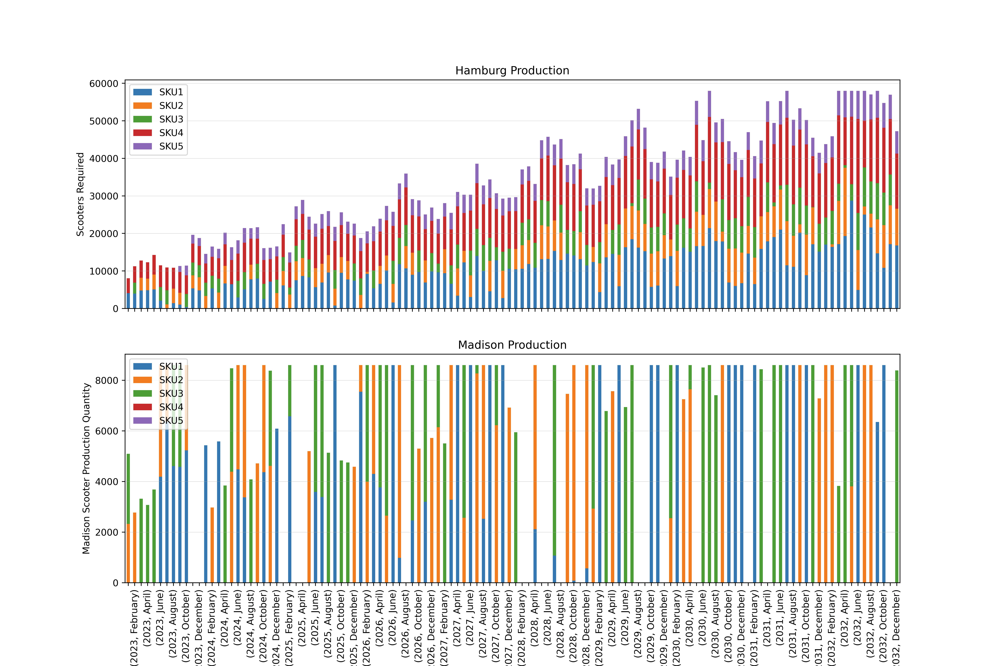

# Storage

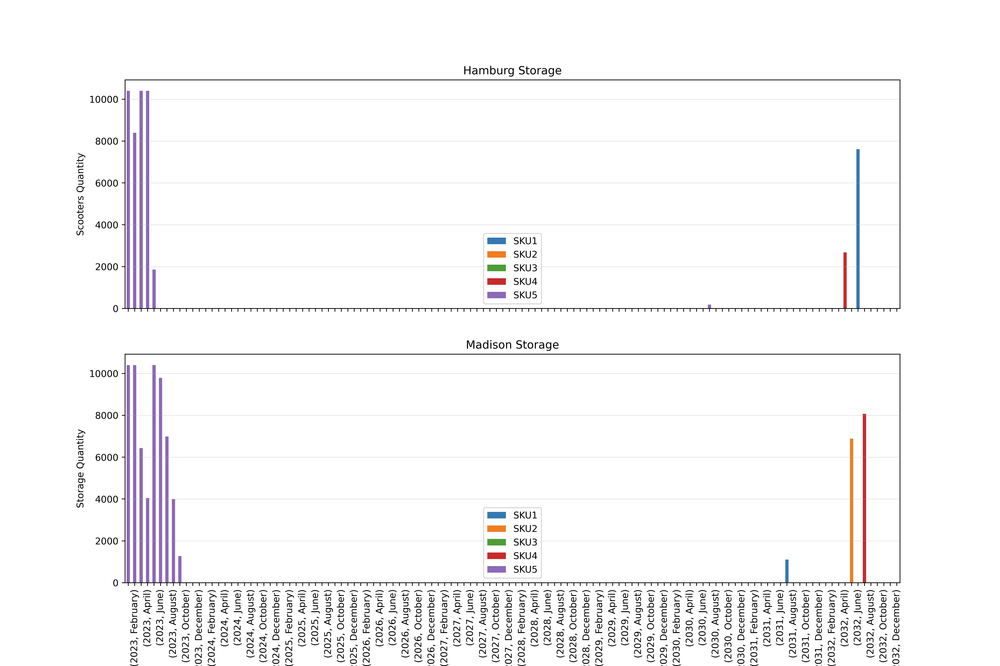